In [3]:
import torch
import torch.nn as nn
import IPython.display as ipd
import torchaudio
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import umap
import numpy as np
import pandas as pd
from tqdm import tqdm

SR = 16000

## 0. Load Trained Model

In [4]:
class SpecModel(nn.Module):
    def __init__(self, sr, n_fft, hop_length, n_mels):
        super().__init__()
        self.mel_converter = torchaudio.transforms.MelSpectrogram(sample_rate=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
        self.db_converter = torchaudio.transforms.AmplitudeToDB()
    
    def forward(self, audio_sample):
        mel_spec = self.mel_converter(audio_sample)
        db_spec = self.db_converter(mel_spec)
        return db_spec

class AutoTaggingModel(nn.Module):
    def __init__(self, sr, n_fft, hop_length, n_mels, hidden_size=32, output_size=50):
        super().__init__()
        self.spec_converter = SpecModel(sr, n_fft, hop_length, n_mels)
        self.sr = sr
        self.hidden_size = hidden_size
        self.conv_layer = nn.Sequential(
            # L==911
            nn.Conv1d(in_channels=n_mels, out_channels=hidden_size, kernel_size=3, padding=0),  #L==909
            nn.MaxPool1d(3), #L=303
            nn.ReLU(),
            nn.Conv1d(in_channels=hidden_size, out_channels=hidden_size, kernel_size=3, padding=0), #301
            nn.MaxPool1d(3), # L=100
            nn.ReLU(),
            nn.Conv1d(in_channels=hidden_size, out_channels=hidden_size, kernel_size=3, padding=0), # 98
            nn.MaxPool1d(3),
            nn.ReLU()) # 32
        
        self.final_layer = nn.Linear(in_features=hidden_size, out_features=output_size)
        
    def forward(self, audio_sample):
        spec = self.spec_converter(audio_sample)
        # spec.shape == Batch_size x Number of Mel Bins (Num Input Channels) X Number of Time Frames (L)
        out = self.conv_layer(spec)
        out = torch.max(out, dim=-1)[0]
        out = self.final_layer(out)
        out = torch.sigmoid(out)
        return out
        
    def get_embedding(self, audio_sample):
        spec = self.spec_converter(audio_sample)
        emb = self.conv_layer[:-1](spec)
        return emb
      

In [5]:
model = AutoTaggingModel(16000, 1024, 512, 48, hidden_size=32)
saved_model = torch.load("week10_auto_tagging_model.pt", map_location='cpu')
model.load_state_dict(saved_model)
# 

<All keys matched successfully>

In [6]:
saved_model

OrderedDict([('spec_converter.mel_converter.spectrogram.window',
              tensor([0.0000e+00, 9.4175e-06, 3.7640e-05,  ..., 8.4698e-05, 3.7640e-05,
                      9.4175e-06])),
             ('spec_converter.mel_converter.mel_scale.fb',
              tensor([[-0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.4230, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.8459, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      ...,
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0717],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0358],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]])),
             ('conv_layer.0.weight',
              tensor([[[-0.0532, -0.0738, -0.2610],
                       [-0.0679, -0.1780, -0.1315],
                       [-0.0356, -0.0233,  0.0508],
                       ...,
                       [ 0.1094

In [7]:
model.state_dict()

OrderedDict([('spec_converter.mel_converter.spectrogram.window',
              tensor([0.0000e+00, 9.4175e-06, 3.7640e-05,  ..., 8.4698e-05, 3.7640e-05,
                      9.4175e-06])),
             ('spec_converter.mel_converter.mel_scale.fb',
              tensor([[-0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.4230, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.8459, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      ...,
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0717],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0358],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]])),
             ('conv_layer.0.weight',
              tensor([[[ 0.0719, -0.0554,  0.0080],
                       [ 0.0309,  0.0003, -0.0019],
                       [-0.0066,  0.0779, -0.0408],
                       ...,
                       [-0.0020

In [8]:
model.load_state_dict(saved_model)

<All keys matched successfully>

In [9]:
model.state_dict()

OrderedDict([('spec_converter.mel_converter.spectrogram.window',
              tensor([0.0000e+00, 9.4175e-06, 3.7640e-05,  ..., 8.4698e-05, 3.7640e-05,
                      9.4175e-06])),
             ('spec_converter.mel_converter.mel_scale.fb',
              tensor([[-0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.4230, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      [0.8459, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
                      ...,
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0717],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0358],
                      [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]])),
             ('conv_layer.0.weight',
              tensor([[[-0.0532, -0.0738, -0.2610],
                       [-0.0679, -0.1780, -0.1315],
                       [-0.0356, -0.0233,  0.0508],
                       ...,
                       [ 0.1094

In [13]:
model.vocab

AttributeError: 'AutoTaggingModel' object has no attribute 'vocab'

In [6]:
class MTATDataset:
  def __init__(self, dir, split='train'):
    self.dir = dir
    self.labels = pd.read_csv(dir / "meta.csv", index_col=[0])
    self.sr = 16000

    if split=="train":
      sub_dir_ids = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'a', 'b', 'c']
    elif split=='valid':
      sub_dir_ids = ['d']
    else: #test
      sub_dir_ids = ['e', 'f', 'g']

    is_in_set = [True if x[0] in sub_dir_ids else False for x in self.labels['mp3_path'].values.astype('str')]
    self.labels = self.labels.iloc[is_in_set]

    self.vocab = self.labels.columns.values[1:-1]
    self.audios = self.load_audio_dataset()
    self.label_tensor = self.convert_label_to_tensor()
    
  def load_audio_dataset(self):
    return [self.load_audio_and_resample(self.dir/x) for x in tqdm(self.labels['mp3_path'].values)]

  def load_audio_and_resample(self, audio_path):
    audio, sr = torchaudio.load(audio_path)
    resampled_audio = torchaudio.functional.resample(audio, orig_freq=sr, new_freq=self.sr)
    return resampled_audio.squeeze()

  def convert_label_to_tensor(self):
    return torch.LongTensor(self.labels.values[:, 1:-1].astype('bool'))

  def __getitem__(self, idx):
    audio = self.audios[idx]
    tag = self.label_tensor[idx]
    return audio, tag

  def __len__(self):
    return len(self.labels)

data_dir = Path('../MTAT_SMALL')
validset = MTATDataset(data_dir, split='valid')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:09<00:00, 101.71it/s]


In [7]:
model.vocab = validset.vocab
# model.final_layer

In [11]:
selected_model = model
DEV = 'cuda'
selected_model = selected_model.to(DEV)
your_audio_path = '9.mp3'
THRESHOLD = 0.1
y, sr = torchaudio.load(your_audio_path)
if sr!= selected_model.sr:
  y = torchaudio.functional.resample(y, orig_freq=sr, new_freq=selected_model.sr)
if y.shape[0] > 1:
  y = torch.sum(y, dim=0) / y.shape[0]
sliced_y = y
y.shape[0] / selected_model.sr
with torch.no_grad():
  pred = selected_model(sliced_y.unsqueeze(0).to(DEV)).to('cpu')
pred = pred.squeeze()
ipd.display(ipd.Audio(sliced_y, rate=selected_model.sr))
print(f"Predicted tags are: {model.vocab[pred>THRESHOLD]}")

Predicted tags are: ['classical' 'guitar' 'string' 'slow' 'no singer']


## 1. Check MTAT-model with GTZAN Dataset

In [36]:
class AudioSet(Dataset):
  def __init__(self, dir_path, sr, split_type):
    if isinstance(dir_path, str):
      dir_path = Path(dir_path)
    self.dir = dir_path
    self.sr = sr
  
    pt_files = self.dir.rglob('*.pt')
    if split_type == "train":
      pt_files = [x for x in pt_files if int(x.stem.split('.')[1]) < 60]
    elif split_type == "valid":
      pt_files = [x for x in pt_files if 60 <= int(x.stem.split('.')[1]) < 80]
    elif split_type == "test":
      pt_files = [x for x in pt_files if  int(x.stem.split('.')[1]) >= 80]
    self.audio = [torch.load(x) for x in pt_files]
    self.label = [x.stem.split('.')[0] for x in pt_files]
    
    genre_names = list(set(self.label))
    self.gnr_to_id = {x:i for i, x in enumerate(genre_names)}

  def __getitem__(self, idx):
    audio = self.audio[idx]
    audio = audio[:self.sr*28]
    label = self.label[idx]
    label_id = self.gnr_to_id[label]
    return audio, label_id
#     return self.audio[idx][:self.sr*28], self.gnr_to_id[self.label[idx]]
    # selected_audio = self.audio[idx]
    # sliced_audio = selected_audio[self.sr*10:self.sr*13]

  def __len__(self):
    return len(self.audio)

  
dataset = AudioSet('../GTZAN', SR, split_type="train")
test_loader = DataLoader(dataset, shuffle=False, batch_size=128)

In [23]:
len(dataset)

600

In [28]:
len(dataset.audio)

600

### 1-1. Get Embedding

In [37]:
def get_embedding_from_loader(model, loader, device):
  model = model.to(device)
#   total_embs = torch.zeros([len(loader.dataset), model.hidden_size]) # number of data X embedding_size
  total_embs = []
  model.eval()
  with torch.no_grad(): # Don't calculate gradient
    for batch in loader:
      audio,_ = batch
      emb = model.get_embedding(audio.to(device))
      emb,_ = torch.max(emb,dim=-1)
      total_embs.append(emb)
  return torch.cat(total_embs, dim=0).cpu()

embs = get_embedding_from_loader(model, test_loader, 'cuda')

In [39]:
embs, embs.shape

(tensor([[ 11.2980,  13.3839,  11.7035,  ...,  14.5610,  -4.1791,  -6.3936],
         [ 15.1325,  12.7415,   8.9922,  ...,  16.1735,  -3.2922,  -3.2203],
         [  6.9239,   8.6147,  10.0092,  ...,  13.6938,  -3.0879,  -3.9181],
         ...,
         [ 22.6269,  14.3319,  17.0963,  ...,  20.3884,  -5.1605, -11.1427],
         [  7.9746,  13.4676,  14.9434,  ...,  19.7586,  -6.1983, -12.9356],
         [ 13.6781,  11.9433,  13.7086,  ...,  15.0424,  -3.2056,  -5.8056]]),
 torch.Size([600, 32]))

In [40]:
embs[0]

tensor([11.2980, 13.3839, 11.7035, 11.8995,  6.9842, 10.0900,  8.5384, 12.0261,
        11.1184,  5.5178,  9.5941, -4.9809, -5.9745,  4.2450,  9.5699, -2.5271,
         9.7146,  4.7165,  4.2263,  7.3082, -5.1593, -4.4109, -6.6900, -3.6001,
         3.6721,  8.2226, 13.6945,  2.1108, 11.6978, 14.5610, -4.1791, -6.3936])

In [42]:
audio, label_id = dataset[0]
ipd.Audio(audio, rate=16000)

### 1-2. Reduce Embedding to 2-dimension data
- PCA
- t-SNE
- UMAP

/home/teo/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/teo/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


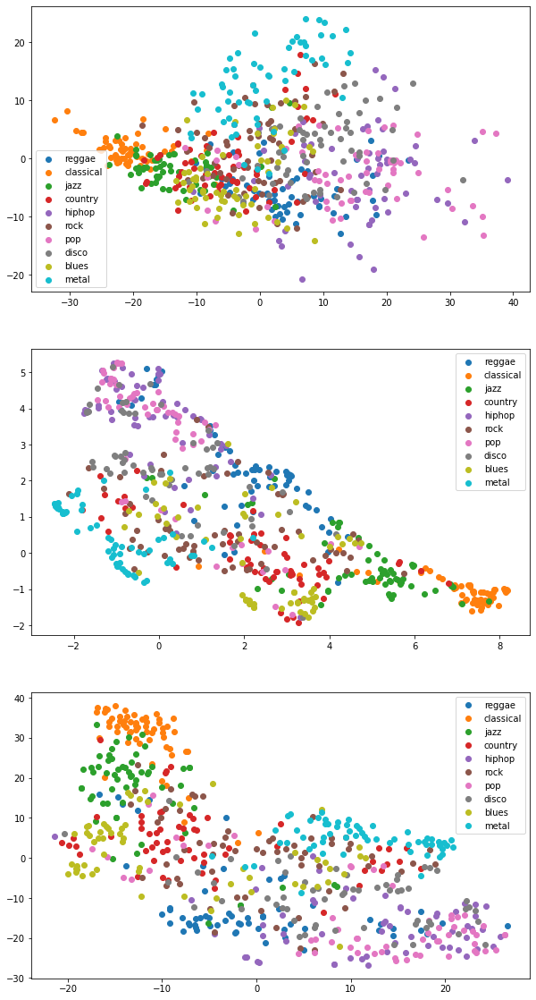

In [43]:
def get_pca_embedding(embedding, n=2):
  x_embedded = PCA(n_components=n).fit_transform(embedding)
  return x_embedded

def get_umap_embedding(embedding, n=2):
  reducer = umap.UMAP(n_components=n)
  umap_emb = reducer.fit_transform(embedding)
  return umap_emb

def get_tsne_embedding(embedding, n=2):
  x_embedded = TSNE(n_components=n).fit_transform(embedding)
  return x_embedded

def plot_embedding_of_piece(model, audio_path):
  audio_sample_batch = load_audio_as_batch(audio_path)
  embedding = get_embedding_of_piece(model, audio_sample_batch)
  redc_emb = get_pca_of_embedding(embedding)
#   redc_emb = get_umap_embedding(embedding)
  
#   for i, emb in enumerate(redc_emb):
#     plt.scatter(emb[0], emb[1], c='red', s=(i+2)*1.5, alpha=(i+1)/len(redc_emb))
  plt.scatter(pca_emb[:,0], pca_emb[:,1])
  

# redc_emb = get_umap_embedding(embs
pca_emb = get_pca_embedding(embs)
umap_emb = get_umap_embedding(embs)
tsne_emb = get_tsne_embedding(embs)
labels = np.asarray(test_loader.dataset.label)
genre_names = set(labels)

plt.figure(figsize=(10,20))
for gnr in genre_names:
  plt.subplot(3,1,1)
  plt.scatter(pca_emb[labels==gnr,0], pca_emb[labels==gnr,1], )
  plt.subplot(3,1,2)
  plt.scatter(umap_emb[labels==gnr,0], umap_emb[labels==gnr,1], )
  plt.subplot(3,1,3)
  plt.scatter(tsne_emb[labels==gnr,0], tsne_emb[labels==gnr,1], )

  
plt.subplot(3,1,1)
plt.legend(genre_names)
  
plt.subplot(3,1,2)
plt.legend(genre_names)
  
plt.subplot(3,1,3)
plt.legend(genre_names)

### 1-3. 3D Plot

In [44]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()


In [45]:
pca_emb3 = get_pca_embedding(embs,3)
umap_emb3 = get_umap_embedding(embs,3)
tsne_emb3 = get_tsne_embedding(embs,3)

def make_scatter3d(emb, label):
  trace = go.Scatter3d(
    x=emb[:,0],  # <-- Put your data instead
    y=emb[:,1],  # <-- Put your data instead
    z=emb[:,2],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 2,
        'opacity': 0.5,
    },
    name = label
  )
  return trace

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [make_scatter3d(umap_emb3[labels==gnr], gnr) for gnr in genre_names]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


/home/teo/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/teo/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [46]:
data = [make_scatter3d(pca_emb3[labels==gnr], gnr) for gnr in genre_names]
plot_figure = go.Figure(data=data, layout=layout)
# Render the plot.
plotly.offline.iplot(plot_figure)


In [47]:
data = [make_scatter3d(tsne_emb3[labels==gnr], gnr) for gnr in genre_names]
plot_figure = go.Figure(data=data, layout=layout)
# Render the plot.
plotly.offline.iplot(plot_figure)

## 2. Similarity Search

In [49]:
emb_a = embs[0]
emb_b = embs[10]

In [50]:
emb_a, emb_b

(tensor([11.2980, 13.3839, 11.7035, 11.8995,  6.9842, 10.0900,  8.5384, 12.0261,
         11.1184,  5.5178,  9.5941, -4.9809, -5.9745,  4.2450,  9.5699, -2.5271,
          9.7146,  4.7165,  4.2263,  7.3082, -5.1593, -4.4109, -6.6900, -3.6001,
          3.6721,  8.2226, 13.6945,  2.1108, 11.6978, 14.5610, -4.1791, -6.3936]),
 tensor([12.4716, 11.3586, 17.1471, 16.4487, 11.3018,  5.8318,  6.3915,  8.3692,
          9.8531,  1.8658, 11.3485, -4.3472, -1.8798, 10.0042,  5.3966,  1.5488,
          6.3114,  1.2636,  1.9551,  9.9774, -3.3252, -1.8608, -5.3607, -2.9422,
         11.0912,  5.7882, 18.1743, -3.6275, 16.4038, 20.6022, -4.4536, -5.7633]))

In [51]:
emb_a * emb_b

tensor([140.9041, 152.0223, 200.6817, 195.7308,  78.9341,  58.8425,  54.5734,
        100.6490, 109.5512,  10.2954, 108.8777,  21.6528,  11.2311,  42.4683,
         51.6450,  -3.9140,  61.3127,   5.9599,   8.2627,  72.9172,  17.1559,
          8.2077,  35.8630,  10.5922,  40.7279,  47.5942, 248.8883,  -7.6571,
        191.8897, 299.9887,  18.6124,  36.8483])

In [52]:
torch.sum(emb_a*emb_b)

tensor(2431.3093)

In [59]:
def get_cosine_sim(emb, embs):
  return torch.sum(emb * embs, dim=1) / (torch.sum(emb**2) * torch.sum(embs**2, dim=-1)) ** 0.5

tgt_idx = 0
tgt_emb = embs[tgt_idx]
cos_similarities = get_cosine_sim(tgt_emb, embs)
cos_similarities[tgt_idx]=0
audio, label = test_loader.dataset[tgt_idx]
ipd.Audio(audio, rate=SR)

In [60]:
cos_similarities

tensor([0.0000, 0.9311, 0.8931, 0.9400, 0.9447, 0.9391, 0.9670, 0.9341, 0.9525,
        0.9481, 0.9240, 0.9185, 0.9682, 0.9476, 0.9637, 0.9581, 0.9558, 0.9198,
        0.9492, 0.9203, 0.9212, 0.9110, 0.9454, 0.9242, 0.9114, 0.9471, 0.9471,
        0.9372, 0.9084, 0.9413, 0.9216, 0.9604, 0.9103, 0.8871, 0.9572, 0.9425,
        0.8829, 0.9678, 0.9207, 0.9570, 0.9477, 0.9246, 0.9509, 0.9289, 0.9100,
        0.9436, 0.9598, 0.9408, 0.9146, 0.9559, 0.9207, 0.9708, 0.9195, 0.8795,
        0.9522, 0.9459, 0.9111, 0.9071, 0.9129, 0.9536, 0.9001, 0.8993, 0.9613,
        0.9404, 0.9588, 0.9064, 0.8973, 0.9384, 0.9463, 0.9499, 0.8954, 0.9557,
        0.8594, 0.8895, 0.9581, 0.9020, 0.8716, 0.9735, 0.9023, 0.8550, 0.9168,
        0.9407, 0.8966, 0.8393, 0.9610, 0.9680, 0.9169, 0.9316, 0.8767, 0.8928,
        0.9642, 0.9561, 0.9303, 0.9638, 0.9190, 0.9122, 0.8920, 0.8706, 0.8723,
        0.8870, 0.9233, 0.9253, 0.9474, 0.9060, 0.9271, 0.8985, 0.8893, 0.8539,
        0.8610, 0.9068, 0.9033, 0.8534, 

### 2-2. Most Similar Piece

In [63]:
_, search_idx = torch.max(cos_similarities, dim=0)
print(search_idx)
audio, label = test_loader.dataset[search_idx]
ipd.Audio(audio, rate=SR)

tensor(77)


### 2-3. Least Similar Piece

In [64]:
cos_similarities[tgt_idx] = 0.9
_, search_idx = torch.min(cos_similarities, dim=0)
print(search_idx)
audio, label = test_loader.dataset[search_idx]
ipd.Audio(audio, rate=SR)

tensor(285)


In [71]:
embs[1], tgt_emb

(tensor([-0.5206, -0.3709, -1.8718, -0.8932, -3.2792, -1.4034,  1.8954, -4.0428,
         -3.2045, -1.6305, -2.5097, -2.9220, -1.2440, -0.4317,  0.2767, -2.3219,
         -2.1566, -0.8746, -0.8051, -0.2724, -0.1686, -1.2971, -2.3637, -0.1722,
         -0.4360, -1.1663, -0.9822, -2.0443,  1.3749, -0.6553, -1.5270, -0.8961]),
 tensor([-0.4542, -0.8025, -1.0869, -0.7492, -3.0144, -0.7950,  1.8108, -3.1245,
         -2.7363, -0.7628, -1.6175, -2.5890, -0.8638,  0.2627,  1.0243, -1.8862,
         -1.7369, -0.9210, -0.1631, -0.9240, -0.1795, -1.3800, -1.8156, -0.3220,
         -0.8036, -1.0006, -0.1474, -1.2332,  1.3855, -0.3097, -1.2897, -0.5884]))